<font  style="font-size: 4rem"> Evolution dans le rap </font>

<font  style="font-size: 2rem"> Quentin Le Lan & Marius Le Douarin </font>

**Table of contents**<a id='toc0_'></a>    
- [Pré traitement](#toc1_)    
- [Visualisation](#toc2_)    
  - [Les analyses au tour du nombre de son](#toc2_1_)    
    - [Nombre de son par année](#toc2_1_1_)    
    - [Nombre de son par artiste](#toc2_1_2_)    
    - [Nombre de son par année et par artiste](#toc2_1_3_)    
  - [Les analyses autour du nombre de feat](#toc2_2_)    
    - [Nombre de feat par artiste](#toc2_2_1_)    
    - [Nombre de feat par artiste par an](#toc2_2_2_)    
    - [Différence entre nombre de feat et nombre de son par artiste](#toc2_2_3_)    
    - [Evolution du nombre moyen de feat par années](#toc2_2_4_)    
- [Les lyrics](#toc3_)    
  - [pré-trairement](#toc3_1_)    
  - [Visualisation](#toc3_2_)    
    - [Nuage de mot](#toc3_2_1_)    
    - [Nuage de mot générale](#toc3_2_2_)    
    - [Les mots les plus utilisés en générale](#toc3_2_3_)    
    - [Evolution du vocabulaire](#toc3_2_4_)    
      - [Les nouveaux mots chaque années](#toc3_2_4_1_)    
      - [Le nombre de nouveaux mots chaque années](#toc3_2_4_2_)    
      - [Les mots les plus utilisés par années](#toc3_2_4_3_)    
      - [Evolution du nombre moyen de mot par chanson par années](#toc3_2_4_4_)    
      - [Evolution du nombre moyen de mot par chanson par artistes](#toc3_2_4_5_)    

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

Dans le cadre du cours de DataEngeneering de l'ESIR nous devions mener une étude (collecte de données et analyse) sur un sujet libre. Comme nous écoutons beaucoup de rap au quotidiens, nous avons décider d'analyser certaines tendances dans le rap, comme par exemple l'évolution des lyrics ou bien du nombre de feat. 

Les données

Il nous fallait donc une liste de rappeur. Pour cela nous avons tout simplement récupérer tous les rappeurs présent sur la page Wikipédia :
[Liste des rappeurs FR page 1](https://fr.wikipedia.org/wiki/Cat%C3%A9gorie:Rappeur_fran%C3%A7ais) & [Liste des rappeurs FR page 2](https://fr.wikipedia.org/w/index.php?title=Cat%C3%A9gorie:Rappeur_fran%C3%A7ais&pagefrom=MC+Circulaire#mw-pages)

Une fois chose faite nous avons récupérer toutes leurs chansons à partir de l'API Genius. Nous avons donc pu créer un dataset à partir de ça. 

In [2]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from collections import Counter
import re
import pandas as pd
from stop_words import get_stop_words
import statistics

On ajoute les stop_words français

In [3]:
stop_words = get_stop_words('fr')
#print (stop_words)

Une option pour afficher toutes les lyrics dans la visualisation des dataframes :

In [ ]:
pd.set_option('max_colwidth', 1000000)

On récupére le dataframe.

In [4]:
df=pd.read_csv("./lyrics_df.csv")
df

,Year,Song Title,Artist,Lyrics,Number of featured artists
0,2011.0,185 Litrons (Ft. N.O.S),Ademo,"\n\nTrop d'marmites dans l'rap, j'rentre, j'op...",1
1,2009.0,1mn guinze,Ademo,\n\nVa falloir faire des choses\nVa falloir do...,0
2,2009.0,À l'heure où je chante (Ft. Farah (FRA)),Ademo,"\n\n\nÀ l’heure où j’chante\nC’est ça, le mond...",1
3,2012.0,À mon signal (Ft. Mac Kregor),Ademo,\n\nA mon signal ...\n\n\n,1
4,NaN,Ariba*,Ademo,\n\n\n\n,0
...,...,...,...,...,...
11884,2003.0,Paname,MC_Jean_Gab'1,"\nPaname, Paname\nPaname\nPaname, Paname, Pana...",0
11885,1999.0,"Paraît qu't'es hardcore (Ft. Cynéfro, Delta (F...",MC_Jean_Gab'1,"\n\nOriginaires de Guadeloupe, Martinique‚ Del...",4
11886,2010.0,P'tit Charles,MC_Jean_Gab'1,"\n\n\nMa vie, un V8, fils conducteurs : haine,...",0
11887,2016.0,Renoi,MC_Jean_Gab'1,\n\n\nJe fais tourner mes affaires renoi\nSi t...,0


# <a id='toc1_'></a>[Pré traitement](#toc0_)

In [5]:
nb_son=df['Year'].value_counts().sort_index()
print(nb_son)

1.0         1
1984.0      1
1990.0      1
1991.0      1
1992.0      1
1994.0      1
1995.0      1
1996.0     17
1997.0     12
1998.0     49
1999.0     40
2000.0     63
2001.0     53
2002.0     94
2003.0     93
2004.0    110
2005.0    167
2006.0    196
2007.0    266
2008.0    264
2009.0    257
2010.0    287
2011.0    333
2012.0    485
2013.0    420
2014.0    464
2015.0    747
2016.0    792
2017.0    970
2018.0    969
2019.0    905
2020.0    986
2021.0    830
2022.0    610
2023.0    129
Name: Year, dtype: int64


In [6]:
# on mets à None toutes les années en dessout de 19..
df.loc[df['Year'] == 1.0, 'Year'] = None

# <a id='toc2_'></a>[Visualisation](#toc0_)

## <a id='toc2_1_'></a>[Les analyses au tour du nombre de son](#toc0_)

### <a id='toc2_1_1_'></a>[Nombre de son par année](#toc0_)

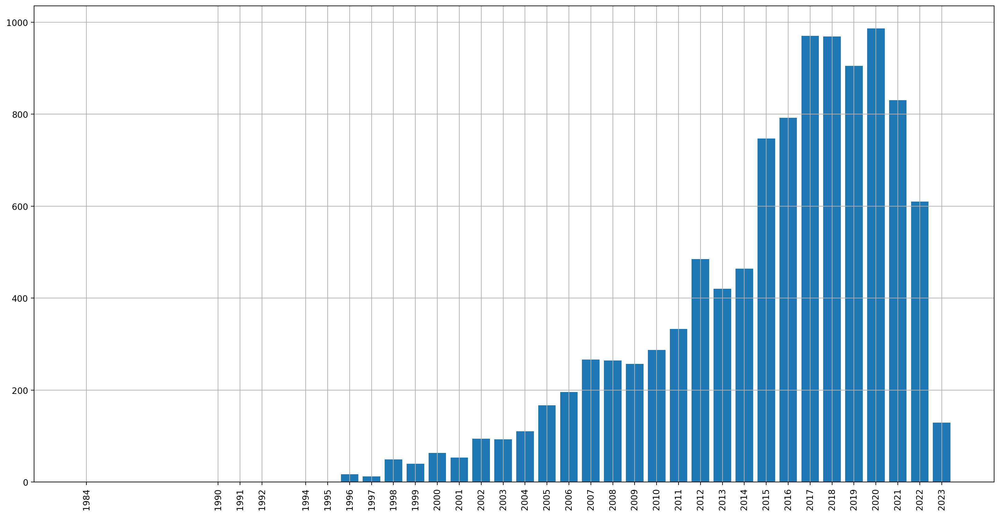

In [7]:
plt.figure(figsize=(20,10), dpi=200)
nb_son=df['Year'].value_counts().sort_index()
plt.bar(nb_son.index,nb_son.values)
plt.xticks(nb_son.index, rotation=90)
plt.grid()
plt.show()

### <a id='toc2_1_2_'></a>[Nombre de son par artiste](#toc0_)

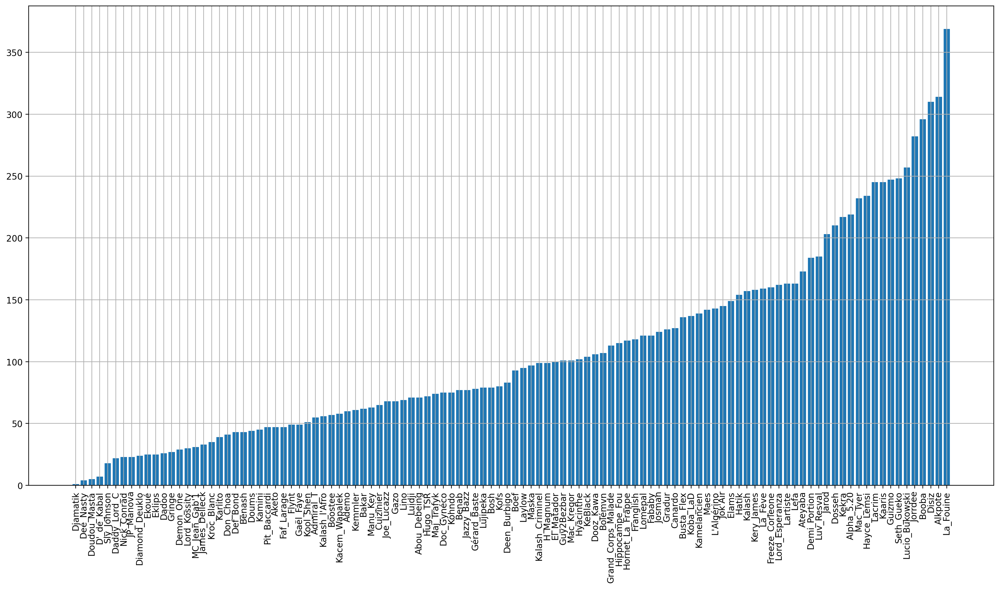

In [13]:
plt.figure(figsize=(20,10), dpi=200)
nb_son_artiste=df.groupby('Artist').size().sort_values()
plt.bar(nb_son_artiste.index,nb_son_artiste.values)
plt.xticks(rotation=90)
#fig.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=0.2, hspace=0.2)
plt.grid()
plt.show()

### <a id='toc2_1_3_'></a>[Nombre de son par année et par artiste](#toc0_)

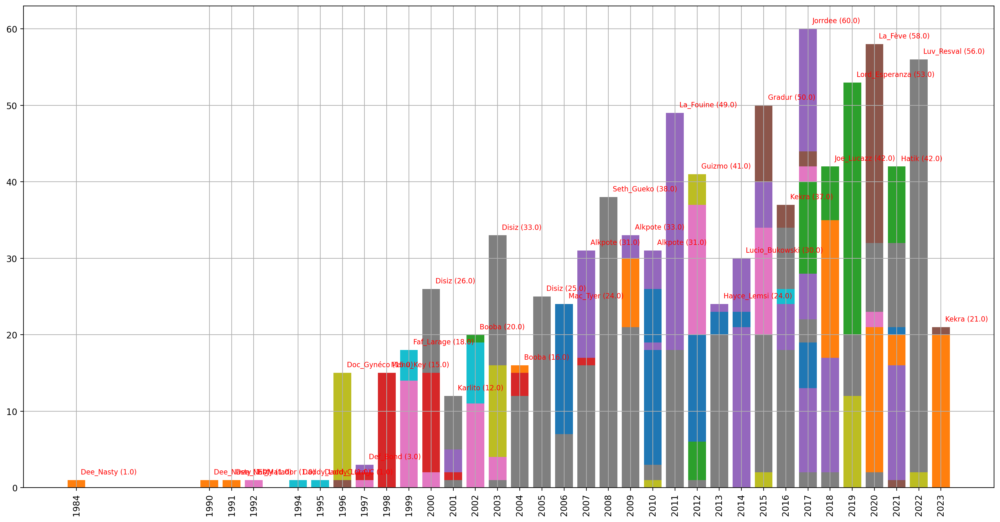

In [15]:
table_pivot = pd.pivot_table(df, values='Song Title', index='Year', columns='Artist', aggfunc=len)
fig, ax = plt.subplots(figsize=(20, 10), dpi=200)

for artist in table_pivot.columns:
    plt.bar(table_pivot.index, table_pivot[artist], label=artist)

# Ajouter le nom de l'artiste ayant le plus de son chaque année
for year in table_pivot.index:
    max_artist = table_pivot.loc[year].idxmax()
    max_count = table_pivot.loc[year].max()
    ax.annotate(f"{max_artist} ({max_count})", xy=(year, max_count), xytext=(5, 5), textcoords="offset points", ha="left", va="bottom", fontsize=8, color="red")

plt.xticks(table_pivot.index, rotation=90)
plt.grid()
plt.show()

## <a id='toc2_2_'></a>[Les analyses autour du nombre de feat](#toc0_)

### <a id='toc2_2_1_'></a>[Nombre de feat par artiste](#toc0_)

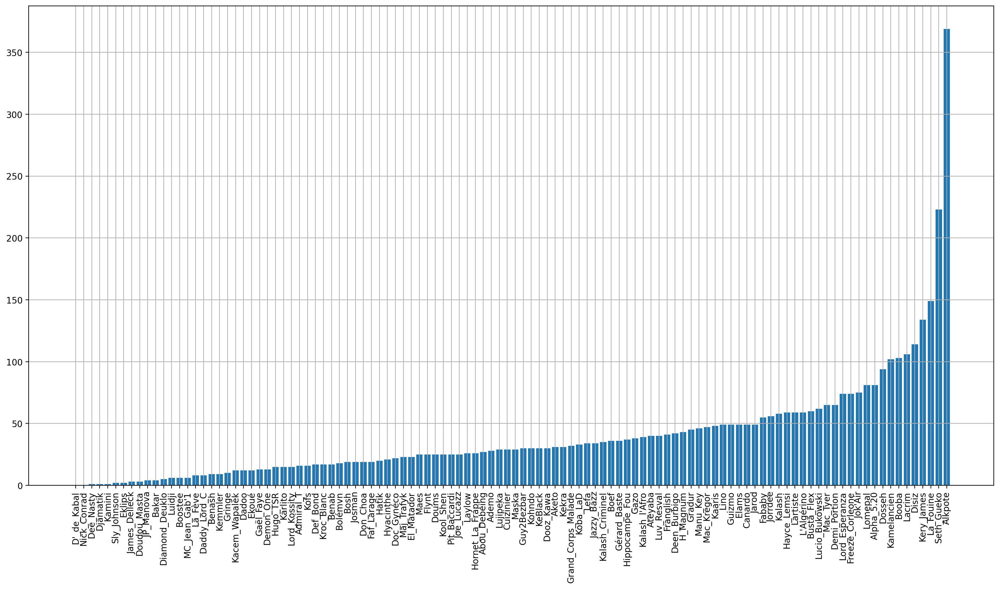

In [16]:
plt.figure(figsize=(20,10), dpi=200)
nb_feat_artiste = df.groupby('Artist')['Number of featured artists'].sum().sort_values()
plt.bar(nb_feat_artiste.index,nb_feat_artiste.values)
plt.xticks(rotation=90)
fig.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=0.2, hspace=0.2)
plt.grid()
plt.show()

### <a id='toc2_2_2_'></a>[Nombre de feat par artiste par an](#toc0_)

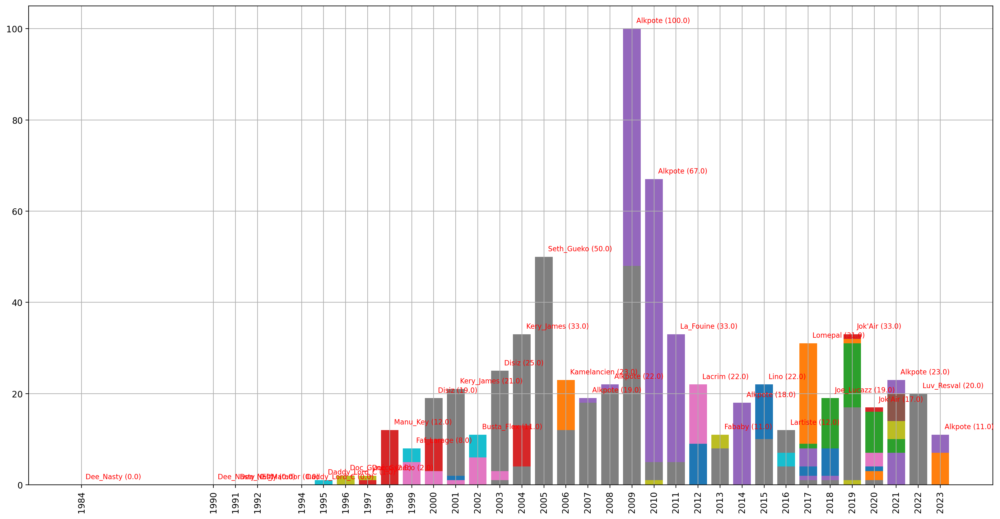

In [17]:
table_pivot = pd.pivot_table(df, values='Number of featured artists', index='Year', columns='Artist', aggfunc=sum)

fig, ax = plt.subplots(figsize=(20, 10), dpi=200)

for artist in table_pivot.columns:
    plt.bar(table_pivot.index, table_pivot[artist], label=artist)

# Ajouter le nom de l'artiste ayant le plus de collaborations chaque année
for year in table_pivot.index:
    max_artist = table_pivot.loc[year].idxmax()
    max_count = table_pivot.loc[year].max()
    ax.annotate(f"{max_artist} ({max_count})", xy=(year, max_count), xytext=(5, 5), textcoords="offset points", ha="left", va="bottom", fontsize=8, color="red")

plt.xticks(table_pivot.index, rotation=90)
plt.grid()
plt.show()

### <a id='toc2_2_3_'></a>[Différence entre nombre de feat et nombre de son par artiste](#toc0_)

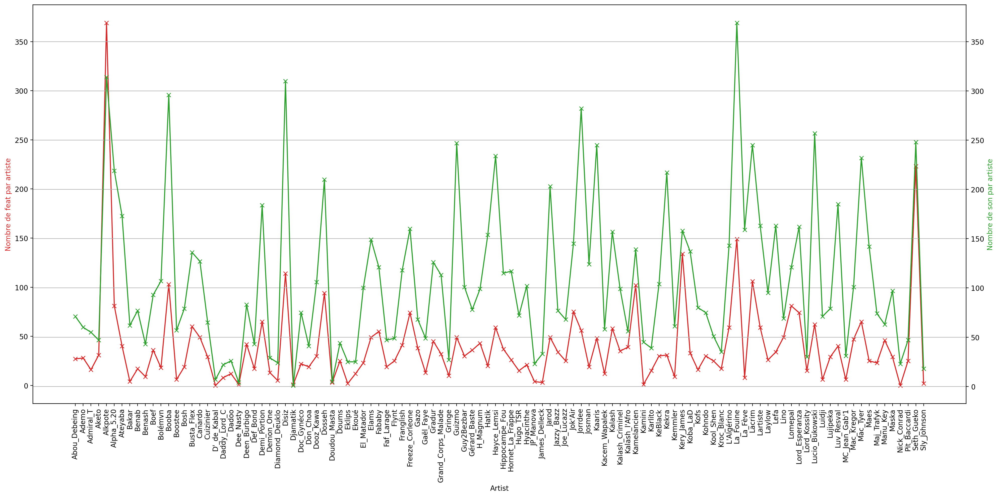

In [17]:
nb_feat_artiste=nb_feat_artiste.sort_index(ascending=True)
nb_son_artiste=nb_son_artiste.sort_index(ascending=True)

#fig = plt.figure(figsize=(12, 8))
fig,ax1 = plt.subplots(figsize=(20,10), dpi=200)

color = 'tab:red'
ax1.set_xlabel('Artist')
ax1.set_ylabel('Nombre de feat par artiste',color=color)
ax1.plot(nb_feat_artiste.index,nb_feat_artiste.values,'-x',label="Nombre de feat par artiste",color=color)
plt.xticks(nb_feat_artiste.index,rotation=90)

ax2=ax1.twinx()
color = 'tab:green'
ax2.set_ylabel('Nombre de son par artiste', color=color)
ax2.plot(nb_son_artiste.index,nb_son_artiste.values,'-x',label="Nombre de son par artiste", color=color)
plt.xticks(nb_feat_artiste.index,rotation=90)
fig.tight_layout()

#plt.legend()
plt.grid()
plt.show()

### <a id='toc2_2_4_'></a>[Evolution du nombre moyen de feat par années](#toc0_)

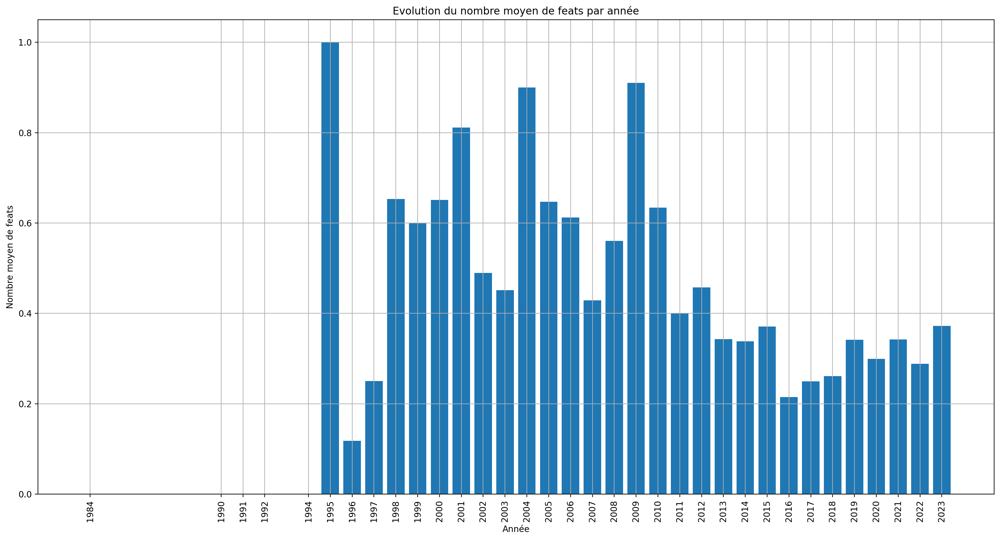

In [18]:
plt.figure(figsize=(20,10), dpi=200)
df_feats_mean = df.groupby('Year')['Number of featured artists'].mean()
plt.bar(df_feats_mean.index, df_feats_mean.values)
plt.xlabel('Année')
plt.ylabel('Nombre moyen de feats')
plt.title('Evolution du nombre moyen de feats par année')
plt.xticks(df_feats_mean.index, rotation=90)
plt.grid()
plt.show()

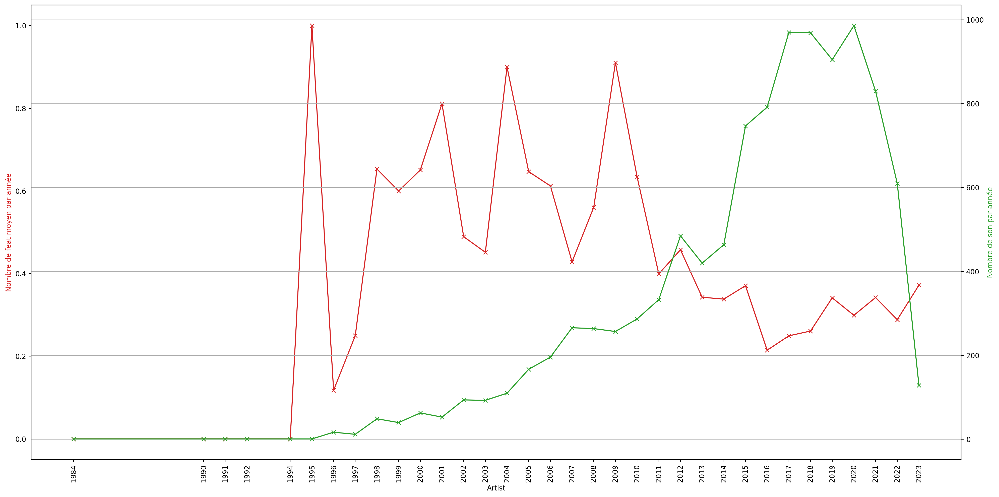

In [38]:
fig,ax1 = plt.subplots(figsize=(20,10), dpi=200)

df_feats_mean = df.groupby('Year')['Number of featured artists'].mean()

color = 'tab:red'
ax1.set_xlabel('Artist')
ax1.set_ylabel('Nombre de feat moyen par année',color=color)
ax1.plot(df_feats_mean.index, df_feats_mean.values,'-x',color=color)
plt.xticks(df_feats_mean.index,rotation=90)

nb_son=df['Year'].value_counts().sort_index()
ax2=ax1.twinx()
color = 'tab:green'
ax2.set_ylabel('Nombre de son par année', color=color)
ax2.plot(nb_son.index,nb_son.values,'-x', color=color)
plt.xticks(nb_son.index,rotation=90)
fig.tight_layout()

#plt.legend()
plt.grid()
plt.show()

# <a id='toc3_'></a>[Les lyrics](#toc0_)

## <a id='toc3_1_'></a>[pré-trairement](#toc0_)

In [28]:
df['Lyrics']=df['Lyrics'].apply(lambda x:re.sub(r'\[(.*?)\]', " ", x,flags=re.DOTALL))
df['Lyrics']=df['Lyrics'].apply(lambda x:re.sub(r'\((.*?)\)', " ", x,flags=re.DOTALL))
df['Lyrics']=df['Lyrics'].apply(lambda x:x.replace("."," "))
df['Lyrics']=df['Lyrics'].apply(lambda x:x.replace("`"," "))
df['Lyrics']=df['Lyrics'].apply(lambda x:x.replace("'"," "))
df['Lyrics']=df['Lyrics'].apply(lambda x:x.replace(","," "))
df['Lyrics']=df['Lyrics'].apply(lambda x:x.replace("?"," "))
df['Lyrics']=df['Lyrics'].apply(lambda x:x.replace("!"," "))
df['Lyrics']=df['Lyrics'].apply(lambda x:x.replace(":"," "))
df['Lyrics']=df['Lyrics'].apply(lambda x:x.replace("\""," "))
df['Lyrics']=df['Lyrics'].apply(lambda x:x.replace("You might also like"," "))
df['Lyrics']=df['Lyrics'].apply(lambda x:x.replace("XXX"," "))
df['Lyrics']=df['Lyrics'].apply(lambda x:x.replace("\n"," "))
df['Lyrics']=df['Lyrics'].apply(lambda x:x.replace("\r"," "))
df['Lyrics']=df['Lyrics'].apply(lambda x:x.replace("#"," "))
df['Lyrics']=df['Lyrics'].apply(lambda x:x.replace("*"," "))
df['Lyrics']=df['Lyrics'].apply(lambda x:x.replace("-"," "))
df['Lyrics']=df['Lyrics'].apply(lambda x:x.replace("’"," "))
df['Lyrics']=df['Lyrics'].apply(lambda x:x.lower())
df = df[df['Lyrics'].str.len() > 0]
df

,Year,Song Title,Artist,Lyrics,Number of featured artists,Mots
0,2011.0,185 Litrons (Ft. N.O.S),Ademo,trop d marmites dans l rap j rentre j opèr...,1,"[trop, d, marmites, dans, l, rap, j, rentre, j..."
1,2009.0,1mn guinze,Ademo,va falloir faire des choses va falloir do do...,0,"[va, falloir, faire, des, choses, va, falloir,..."
2,2009.0,À l'heure où je chante (Ft. Farah (FRA)),Ademo,à l heure où j chante c est ça le monde pa...,1,"[à, l’heure, où, j’chante, c’est, ça, le, mond..."
3,2012.0,À mon signal (Ft. Mac Kregor),Ademo,a mon signal,1,"[a, mon, signal]"
4,NaN,Ariba*,Ademo,,0,[]
...,...,...,...,...,...,...
11884,2003.0,Paname,MC_Jean_Gab'1,paname paname paname paname paname paname ...,0,"[paname, paname, paname, paname, paname, panam..."
11885,1999.0,"Paraît qu't'es hardcore (Ft. Cynéfro, Delta (F...",MC_Jean_Gab'1,originaires de guadeloupe martinique‚ del c...,4,"[originaires, de, guadeloupe, martinique‚, del..."
11886,2010.0,P'tit Charles,MC_Jean_Gab'1,ma vie un v8 fils conducteurs haine ad...,0,"[ma, vie, un, v8, fils, conducteurs, haine, ad..."
11887,2016.0,Renoi,MC_Jean_Gab'1,je fais tourner mes affaires renoi si tu cr...,0,"[je, fais, tourner, mes, affaires, renoi, si, ..."


## <a id='toc3_2_'></a>[Visualisation](#toc0_)

### <a id='toc3_2_1_'></a>[Nuage de mot](#toc0_)

Un des gros problèmes rencontré lors de la création des nuages de mots est les stopWords. Un stopWords c'est tout simplement les mots récurrents qui ne sont pas intérrésant à visualiser par exemple : le,la,les, de, tu ,....Cela n'importe aucune information sur le champ lexicale du rappeurs. Cependant nous ne pouvons tout simplement pas juste tout supprimer. Certain rappeur peuvent sur utilisé un stopWords (par exemple "comme") dans ce cas là il est alors inérrésante de le garder. 

Pour cela nous allons créer un dictionnaire de tous les mots utilisés dans notre dataframe et pour chaque mots on calcule les occurences par rappeurs. 

Une fois chose faite nous pouvons calculer la médiane d'utilisation de chaque mots. Et si un rappeur utilise un mot 4* fois plus que la médiane alors il convient de le représenter. 

In [29]:
df['Mots'] = df['Lyrics'].str.split()
df_exploded = df.explode('Mots')
df_grouped = df_exploded.groupby(['Mots', 'Artist']).size().reset_index(name='Occurrence')

# Regrouper les données par mot et créer une liste d'occurrences par artiste
df_grouped = df_grouped.groupby('Mots').apply(lambda x: dict(zip(x['Artist'], x['Occurrence']))).reset_index(name='Occurences_par_artiste')

# Convertir les données en un dictionnaire qui a la structure souhaitée
dictionnaire = dict(zip(df_grouped['Mots'], df_grouped['Occurences_par_artiste']))

In [24]:
occurrences = dictionnaire.get("amour", {})
occurrence_values = list(occurrences.values())
print(occurrences)

{'Abou_Debeing': 16, 'Ademo': 10, 'Admiral_T': 7, 'Aketo': 24, 'Alkpote': 64, 'Alpha_5.20': 46, 'Ateyaba': 22, 'Bakar': 6, 'Benab': 11, 'Benash': 17, 'Bolémvn': 31, 'Booba': 45, 'Boostee': 24, 'Bosh': 12, 'Busta_Flex': 21, 'Canardo': 40, 'Cuizinier': 26, "D'_de_Kabal": 17, 'Daddy_Lord_C': 5, 'Dadoo': 8, 'Dee_Nasty': 1, 'Deen_Burbigo': 9, 'Def_Bond': 14, 'Demi_Portion': 63, 'Demon_One': 9, 'Diamond_Deuklo': 6, 'Disiz': 213, 'Doc_Gynéco': 20, 'Don_Choa': 17, 'Dooz_Kawa': 112, 'Dosseh': 44, 'Doudou_Masta': 7, 'Doums': 7, 'Eklips': 2, 'El_Matador': 23, 'Elams': 21, 'Fababy': 97, 'Faf_Larage': 5, 'Flynt': 8, 'Franglish': 22, 'Freeze_Corleone': 5, 'Gazo': 12, 'Gaël_Faye': 32, 'Gradur': 29, 'Grand_Corps_Malade': 52, 'Gringe': 31, 'Guizmo': 86, 'Guy2Bezbar': 4, 'Gérard_Baste': 20, 'H_Magnum': 8, 'Hatik': 89, 'Hayce_Lemsi': 82, 'Hippocampe_Fou': 16, 'Hornet_La_Frappe': 26, 'Hugo_TSR': 13, 'Hyacinthe': 116, 'JP_Manova': 7, 'James_Delleck': 23, 'Jarod': 81, 'Jazzy_Bazz': 29, 'Joe_Lucazz': 7, "Jok

In [30]:
medians = {
    mot: statistics.median(list(occurrences.values())) if occurrences else None
    for mot, occurrences in dictionnaire.items()
}

In [31]:
def getStop(texte):
    
    mots = texte.split()
    compteur = Counter(mots)
    nb_total_mots = len(mots)

    # Créer une liste de tuples contenant chaque mot et sa fréquence
    mots_freq = [(mot, occ / nb_total_mots * 100) for mot, occ in compteur.items()]

    # Trier la liste de tuples en fonction de la fréquence décroissante
    mots_freq_tries = sorted(mots_freq, key=lambda x: x[1], reverse=True)

    # Définir un seuil pour le pourcentage de présence des mots que vous souhaitez afficher
    seuil = 0.75

    mots_frequents = [mot for mot, freq in mots_freq_tries if freq >= seuil]
    stop=[]
    non_stop=[]
    for mot in mots_frequents:
        median=medians.get(mot)
        nbOccur = compteur.get(mot)
        if(nbOccur > 4*median and mot in stop_words ):
            stop.append(mot)
        else:
            non_stop.append(mot)
    stop_words_filtrés = [mot for mot in stop_words if mot not in stop]
    return stop_words_filtrés

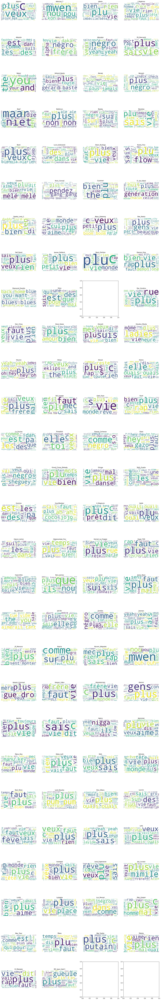

In [27]:
fig, axs = plt.subplots(nrows=int(np.ceil(len(df['Artist'].unique()) / 4)), ncols=4, figsize=(18, 4*int(np.ceil(len(df['Artist'].unique()) / 4))))

for i, artiste in enumerate(df['Artist'].unique()):
    # Filtrer le dataframe pour ne contenir que les chansons de l'artiste
    chansons_artiste = df.loc[df['Artist'] == artiste, 'Lyrics']
    
    # Concaténer tous les titres en une seule chaîne de caractères
    texte = ' '.join(chansons_artiste)
    texte= " ".join([mot for mot in texte.split() if len(mot) >= 3])
    # Supprimer les mots fréquents de la chaîne de caractères

    if(len(texte)!=0):
    # Générer le nuage de mots pour l'artiste
        stop=getStop(texte)
        wordcloud = WordCloud(background_color='white', stopwords=stop, max_words=70).generate(texte)
    
    # Afficher le nuage de mots sur un sous-graphique séparé
        #plt.subplot(1, len(df['Artist'].unique()), list(df['Artist'].unique()).index(artiste)+1)
        axs[i//4, i%4].imshow(wordcloud)
        axs[i//4, i%4].axis("off")
        axs[i//4, i%4].set_title(artiste)
plt.tight_layout()
plt.show()

### <a id='toc3_2_2_'></a>[Nuage de mot générale](#toc0_)

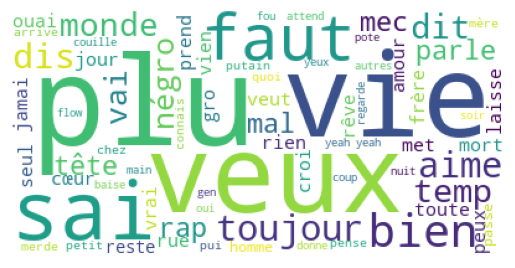

In [32]:
lyrics = "\n".join(df["Lyrics"])
lyrics= " ".join([mot for mot in lyrics.split() if len(mot) >= 3])
wordcloud = WordCloud(background_color='white', stopwords=stop_words, max_words=70).generate(lyrics)
plt.imshow(wordcloud)
plt.axis("off")
plt.show();

### <a id='toc3_2_3_'></a>[Les mots les plus utilisés en générale](#toc0_)

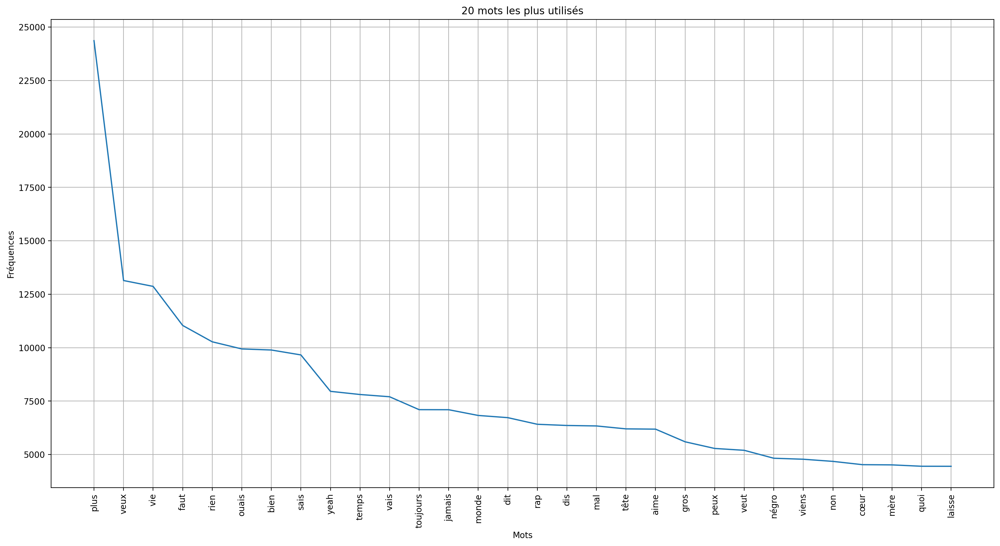

In [34]:
mots_a_supprimer_pattern = r'\b(?:{})\b'.format('|'.join(stop_words))
nouveau_text = re.sub(mots_a_supprimer_pattern, '', lyrics, flags=re.DOTALL)
mots = nouveau_text.split()
compteur = Counter(mots)

top_20 = compteur.most_common(30)

words = [x[0] for x in top_20]
frequencies = [x[1] for x in top_20]

# Tracer un graphique de la distribution des fréquences des 20 mots les plus utilisés
plt.figure(figsize=(20,10), dpi=200)
plt.plot(words, frequencies)
plt.xlabel('Mots')
plt.ylabel('Fréquences')
plt.title('20 mots les plus utilisés')
plt.xticks(rotation=90)
plt.grid()
plt.show()

### <a id='toc3_2_4_'></a>[Evolution du vocabulaire](#toc0_)

Pour faciliter l'analyse de l'évolution du vocabulaire, le plus simple était de créer un nouveau dataset, cette fois-ci par années. Nous avons donc assembler pour chaque années toutes les lyrics, ensuite nous avons compté le nombre de mots, mots unique et le nombre de sons. 

In [35]:
df2 = df.groupby('Year')['Lyrics'].apply(lambda x: x.str.cat(sep=' ')).reset_index()
df2['Mots'] = df2['Lyrics'].str.split().apply(len)
df2['Mots_uniques'] = df2['Lyrics'].str.split().apply(lambda x: pd.Series(x).nunique())
df2=df2.sort_values(by='Year')
df2['Songs_count'] = df['Year'].value_counts().sort_index().values
df2

C:\Users\quent\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  This is separate from the ipykernel package so we can avoid doing imports until


,Year,Lyrics,Mots,Mots_uniques,Songs_count
0,1984.0,paname city rappin c est le paname city ra...,809,241,1
1,1990.0,,0,0,1
2,1991.0,,0,0,1
3,1992.0,yeah je suis de retour comme brandão levez ...,460,224,1
4,1994.0,daddy lord c remet de l ordre ici daddy lord...,550,286,1
5,1995.0,suzie était une fille du genre de celles qu...,519,286,1
6,1996.0,je te gave de basse comme macdonald de matiè...,8593,2278,17
7,1997.0,hein une pensée pour ma mère ibrahim lo re...,6271,1486,12
8,1998.0,busta flex fonky comme la family investit su...,28744,4925,49
9,1999.0,l histoire m a fait faut que j en fasse un...,29773,5087,40


#### <a id='toc3_2_4_1_'></a>[Les nouveaux mots chaque années](#toc0_)

Le but ici est de voir l'évolution du vocabulaire, on avait pensé à regarder la richesse du vocabulaire, c'est à dire le nombre de mots unique chaque années, mais le problème c'est que le nombre de mots unique est totalement corrélé avec le nombre de sons sortie chaque années. Nous avons donc choisis de regarder l'apparition des nouveaux chaque années. Pour ça nous supprimons les mots présents les années présents et gardons que les mots restants. 

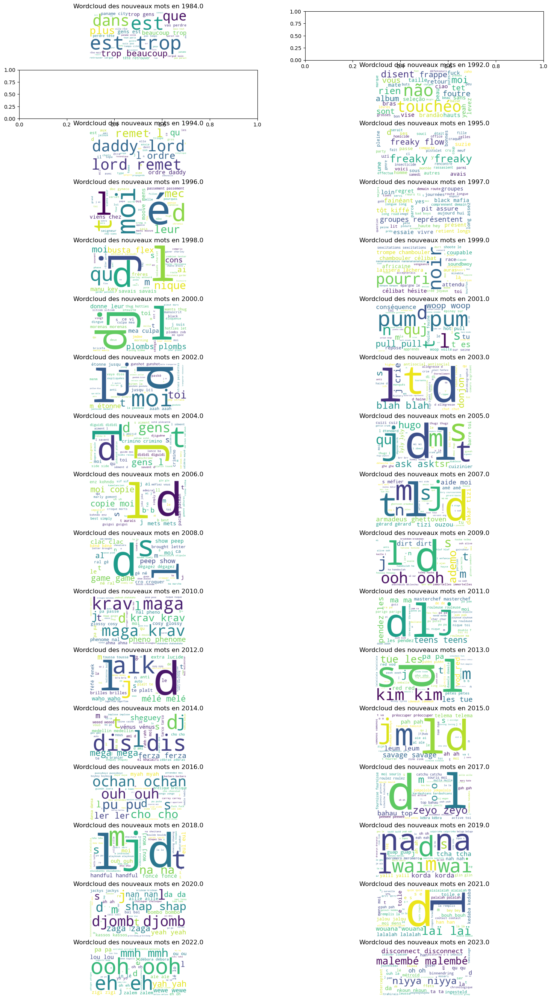

In [32]:
resultat=df2
fig, axes = plt.subplots(nrows=int(np.ceil(len(resultat['Year'].unique()) / 2)), ncols=2, figsize=(18, 2*int(np.ceil(len(resultat['Year'].unique()) / 2))))

for i, year in enumerate(np.unique(resultat['Year'])):
    mots_pre = set(resultat.loc[resultat['Year'] < year , 'Lyrics'].str.split().explode().unique())
    mots = set(resultat.loc[resultat['Year'] == year , 'Lyrics'].str.split().explode().unique())
    lyrics=resultat.loc[resultat['Year'] == year , 'Lyrics']
    lyrics=lyrics.str.cat(sep=' ')
    new_words=mots - mots_pre
    filtered_string = " ".join(filter(lambda word: word in new_words,lyrics.split()))
    filtered_string= " ".join([mot for mot in filtered_string.split() if len(mot) >= 3])
    if(len(filtered_string)!=0):
        wordcloud = WordCloud(background_color='white', max_words=40).generate(filtered_string)
        axes[i//2, i%2].imshow(wordcloud)
        axes[i//2, i%2].axis("off")
        axes[i//2, i%2].set_title(f"Wordcloud des nouveaux mots en {year}")
plt.show()

#### <a id='toc3_2_4_2_'></a>[Le nombre de nouveaux mots chaque années](#toc0_)

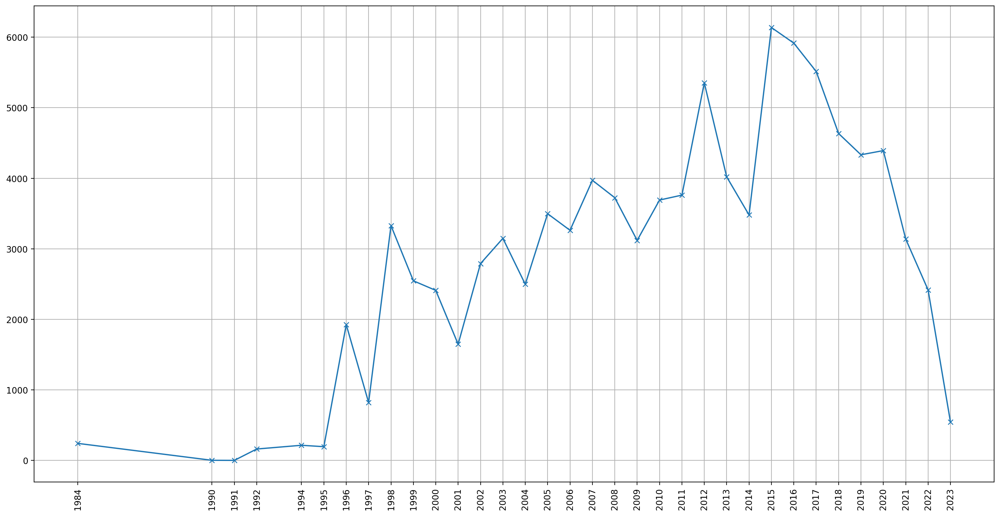

In [36]:
resultat=df2
count=[]
for year in resultat['Year'].unique():
    mots_pre = set(resultat.loc[resultat['Year'] < year , 'Lyrics'].str.split().explode().unique())
    mots = set(resultat.loc[resultat['Year'] == year , 'Lyrics'].str.split().explode().unique())
    new_words= mots - mots_pre
    count.append(len(new_words))

plt.figure(figsize=(20,10), dpi=200)
plt.plot(resultat['Year'],count,'-x')
plt.xticks(resultat['Year'],rotation=90)
plt.grid()
plt.show()

#### <a id='toc3_2_4_3_'></a>[Les mots les plus utilisés par années](#toc0_)

Ici on peut voir le vocabulaire le plus utilisé chaque années. 

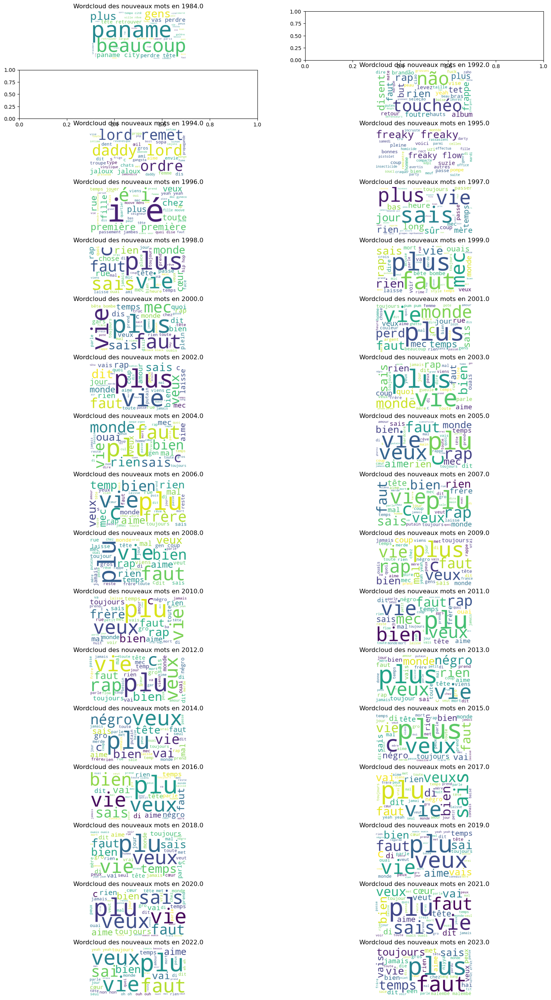

In [33]:
resultat = df2
fig, axes = plt.subplots(nrows=int(np.ceil(len(resultat['Year'].unique()) / 2)), ncols=2, figsize=(18, 2*int(np.ceil(len(resultat['Year'].unique()) / 2))))

for i, year in enumerate(np.unique(resultat['Year'])):
    lyrics=resultat.loc[resultat['Year'] == year , 'Lyrics']
    lyrics=lyrics.str.cat(sep=' ')
    filtered_string= " ".join([mot for mot in lyrics.split() if len(mot) >= 3])
    if(len(filtered_string)!=0):
        wordcloud = WordCloud(background_color='white', stopwords=stop_words, max_words=40).generate(filtered_string)
        axes[i//2, i%2].imshow(wordcloud)
        axes[i//2, i%2].axis("off")
        axes[i//2, i%2].set_title(f"Wordcloud des nouveaux mots en {year}")
plt.show()

#### <a id='toc3_2_4_4_'></a>[Evolution du nombre moyen de mot par chanson par années](#toc0_)

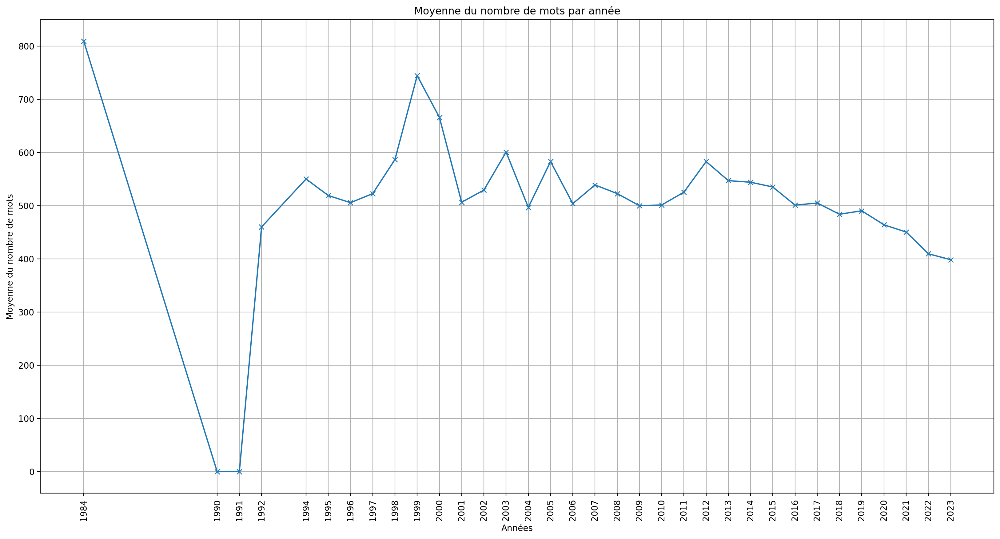

In [37]:
moy_mot=df2["Mots"] / df2["Songs_count"]

plt.figure(figsize=(20,10), dpi=200) # Ajuster la taille de la figure
plt.plot(df2['Year'], moy_mot, '-x')
plt.xticks(df2['Year'],rotation=90)
plt.title("Moyenne du nombre de mots par année")
plt.xlabel("Années")
plt.ylabel("Moyenne du nombre de mots")
plt.grid()
plt.show()

#### <a id='toc3_2_4_5_'></a>[Evolution du nombre moyen de mot par chanson par artistes](#toc0_)

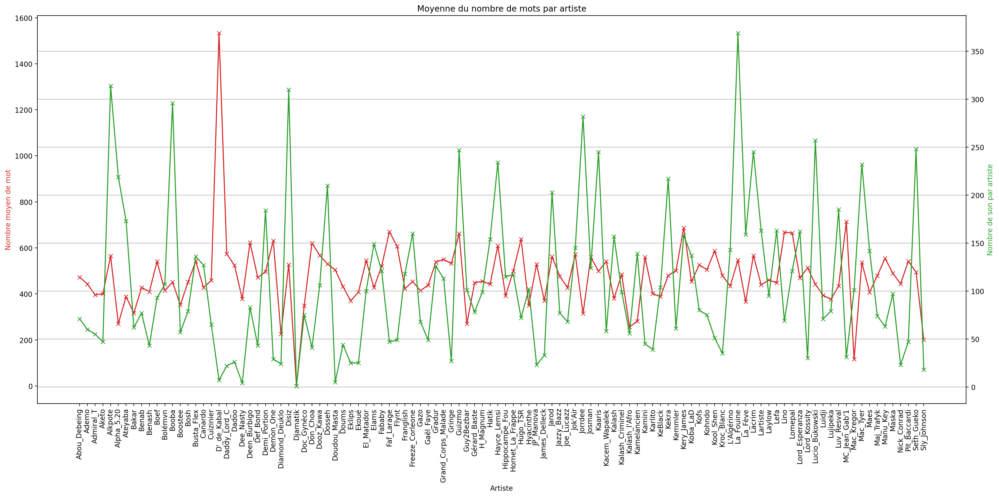

In [24]:
df["nb_mots"]=df['Lyrics'].str.split().apply(len)
df_grouped = df.groupby("Artist")["nb_mots"].mean()
df_grouped=df_grouped.sort_index(ascending=True)

#plt.figure(figsize=(15, 5)) # Ajuster la taille de la figure

fig, ax1 = plt.subplots(figsize=(20,10), dpi=200)

color = 'tab:red'
ax1.set_xlabel('Artiste')
ax1.set_ylabel('Nombre moyen de mot', color=color)
ax1.plot(df_grouped.index, df_grouped.values, '-x',label="Nombre moyen de mot",color=color)
plt.xticks(rotation=90)

ax2 = ax1.twinx()

color = 'tab:green'
ax2.set_ylabel('Nombre de son par artiste', color=color) 
ax2.plot(nb_son_artiste.index,nb_son_artiste.values,'-x',label="Nombre de son par artiste", color=color)
plt.xticks(rotation=90)
plt.title("Moyenne du nombre de mots par artiste")
fig.tight_layout()
plt.grid()
#plt.legend()
plt.show()

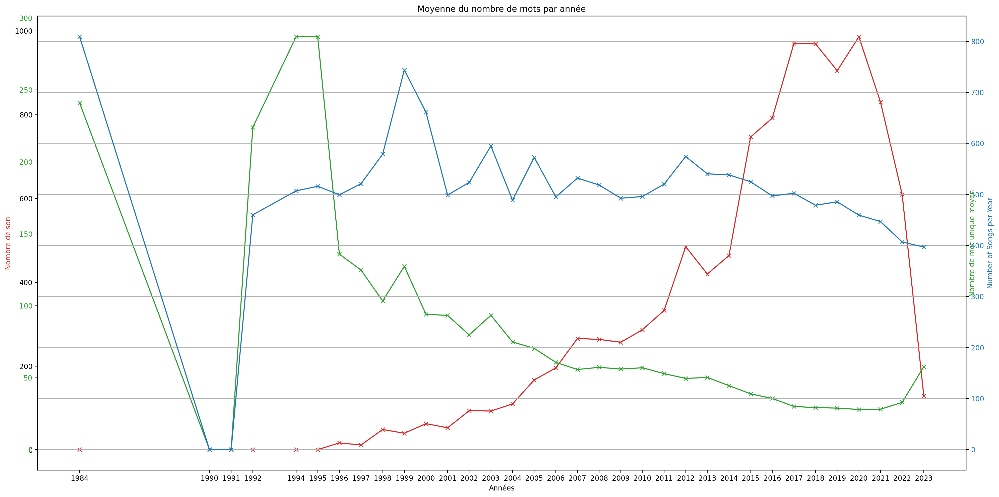

In [25]:
result=df2["Mots_uniques"] / df2["Songs_count"]
moy_mot=df2["Mots"] / df2["Songs_count"]


fig, ax1 = plt.subplots(figsize=(20,10), dpi=200)

color = 'tab:red'
ax1.set_xlabel('Années')
ax1.set_ylabel('Nombre de son', color=color)
ax1.plot(df2['Year'],df2['Songs_count'],'-x',label="Nombre de son",color=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:green'
ax2.set_ylabel('Nombre de mot unique moyen', color=color)
ax2.plot(df2['Year'],result,'-x',label="Nombre de mot unique moyen",color=color)
ax2.tick_params(axis='y', labelcolor=color)

color = 'tab:blue'
ax3 = ax2.twinx()  # instantiate a second axes that shares the same x-axis
ax3.set_ylabel("Number of Songs per Year", color = color)
ax3.plot(df2['Year'],moy_mot,'-x',label="Nombre de mot moyen",color = color)
ax3.tick_params(axis='y', labelcolor=color)

plt.xticks(df2['Year'],rotation=90)
plt.title("Moyenne du nombre de mots par année")
plt.xlabel("Années")
fig.tight_layout()

plt.grid()
plt.show()